# Исследование рынка заведений общественного питания Москвы

В нашем распоряжении данные с заведениями общественного питания Москвы, составленные на основе данных картографических сервисов по состоянию на лето 2022 года.  

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, с целью помочь в выборе подходящего места инвесторам, которые решили попробовать себя в новой области. 

**ЦЕЛЬ ИССЛЕДОВАНИЯ**:

Найти важные закономерности и особенности при выборе подходящего места для заведения общественного питания.



**ХОД ИССЛЕДОВАНИЯ**

Данные о заведениях общественного питания получили из файла moscow_places.csv.    
О качестве данных ничего не известно. Поэтому перед исследованием данных и расчетом показателей понадобится их обзор и предобработка. Проверим данные на ошибки и оценим их влияние на исследование.   
Таким образом, исследование пройдёт в четыре этапа:

1. Загрузка данных и изучение общей информации.
3. Предобработка данных.
4. Анализ данных.
5. Детализация исследования.

### Шаг 1. Загрузка данных и изучение общей информации

Импортируем необходимые библиотеки, настроим отображение таблиц и загрузим данные в переменную `data`.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker, LayerControl
from folium.plugins import MarkerCluster

import warnings
warnings.simplefilter("ignore")

In [2]:
pd.set_option('display.max_columns', None) # настроим отображение всех столбцов на экране
pd.set_option('display.max_colwidth', None) # настроим отображение текста в ячейках
pd.set_option('display.float_format', '{:.3f}'.format) # настроим отображение вещественных чисел до 3 наков

#настроим отображение графиков
plt.rcParams['figure.figsize']=12,6 
plt.rcParams['font.size'] = '12'
plt.style.use('seaborn-pastel')
color = sns.color_palette("crest")

In [3]:
# загружаем данные
try:
    data = pd.read_csv('/datasets/moscow_places.csv')

except:
    data = pd.read_csv('moscow_places.csv')

---

Для быстрого изучения данных создадим функцию `data_info`, которая выведет на экран первые 5 строк таблицы, основную инфоромацию по ней с типами данных каждого признака, информацию о числе пропусков и о количистве дубликатов. Затем применим ее к исследуемому датасету

In [4]:
def data_info(df):
    # выводим первые 5 строк датафрема
    display(df.head())
    # применяем метод info()
    print()
    print('Общая информация:')
    print(df.info())
    print()
    # считаем пропущенные значения:
    print('Число пропущенных значений:')
    print(df.isna().sum())
    print()
    # находим число строк-дубликатов в датафреме
    print('Количество строк-дубликатов:', df.duplicated().sum())

---

In [5]:
data_info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,NaN,0,4.000
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,NaN,0,45.000
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.882,37.489,5.000,NaN,Цена чашки капучино:155–185 ₽,NaN,170.000,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881,37.449,5.000,средние,Средний счёт:400–600 ₽,500.000,NaN,1,148.000



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None

Число пропущенных значений:
name    

В таблице 14 столбцов. Встречаются разные типы данных в столбцах: object, float64 и int64.

Согласно документации:      
**name** — название заведения;    
**category** — категория заведения, например «кафе», «пиццерия» или «кофейня»;    
**address** — адрес заведения;    
**district** — административный район, в котором находится заведение;     
**hours** — информация о днях и часах работы;     
**lat** — широта географической точки, в которой находится заведение;     
**lng** — долгота географической точки, в которой находится заведение;     
**rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);     
**price** — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и т.д.;   
**avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона( например: «Средний счёт: 1000–1500 ₽»; «Цена чашки капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽» и т.д.);     
**middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:     
o	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.   
o	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.    
o	Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.    
**middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:     
o	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.    
o	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.    
o	Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.   
**chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (0 — заведение не является сетевым, 1 — заведение является сетевым);    
  
**seats** — количество посадочных мест.   

В данных есть пропущенные значения, с которыми стоит разобраться подробнее.       
Типы данных, в целом, соответствуют заявленному описанию, единственное - признак `seats` выражен вещественным, а не целым числом, поскольку в столбце есть пропуски.    
Названия колонок соответствуют хорошему стилю.    
Явные дубликаты не выявлены.

**Вывод**   
В каждой строке таблицы - данные о заведении общественного питания г. Москва. Часть столбцов описывает само заведение: его название, место расположения, территориальную принадлежность, отметку о том является ли заведение сетевым. Остальные данные раскрывают качественные характеристики заведения: категорию рейтинга среди пользователей и уровни средних цен.    
Всего в датасете 8406 строк. Предварительно можно утверждать, что данных достаточно для исследования. Но встречаются пропуски в данных, с природой которых необходимо разобраться, а также стоит проверить датасет на неявные дубликаты по признакам, в которых это возможно.

### Шаг 2. Предобработка данных

#### Изучение и заполнение пропусков в данных

Для оценки пропусков выведем долю пропущенных значений по каждому столбцу. Отсортируем полученный результат в порядке убывания методом sort_values(), чтобы легко видеть каких пропусков больше.

In [6]:
data.isna().mean().sort_values(ascending=False)

middle_coffee_cup   0.936
middle_avg_bill     0.625
price               0.606
avg_bill            0.546
seats               0.430
hours               0.064
name                0.000
category            0.000
address             0.000
district            0.000
lat                 0.000
lng                 0.000
rating              0.000
chain               0.000
dtype: float64

Пропусков в датасете не мало. Большинство из них - это качественные характеристики объектов о категории цен и об их среднем уровне. С целью понять природу пропусков изучим признаки более детально.

**middle_coffee_cup / middle_avg_bill**    

Видим, что признак `middle_coffee_cup` почти на 94% состоит из пропущенных значений, а информация с оценкой среднего чека `middle_avg_bill`  отстутствует в 62,5% данных. Такая высокая доля пропущенных значений, вероятно, обусловлена большим числом пропусков средней стоимости заказа `avg_bill`, которая не заполнена на 55%. Логично предположить, что если нет данных о средней стоимости заказа - неоткуда взяться и данным по вышеупомянутым признакам.   
Проверим последнее предположение:

In [7]:
#сделаем срез по пропущенным значениям в столбце со средней стоимостью заказа 
# и проверим какие значения принимает middle_coffee_cup
print('Значения middle_coffee_cup:' , data[data['avg_bill'].isna()]['middle_coffee_cup'].unique())

#сделаем срез по пропущенным значениям в столбце со средней стоимостью заказа 
# и проверим какие значения принимает middle_avg_bill
print('Значения middle_avg_bill:' ,data[data['avg_bill'].isna()]['middle_avg_bill'].unique())

Значения middle_coffee_cup: [nan]
Значения middle_avg_bill: [nan]


Предположение оказалось верным.   
Но стоит отметить, что с другой стороны,  пропусков по этим двум признакам намного больше. И это тоже объяснимо: в столбце `avg_bill` содержатся данные либо со средним счетом заведения, либо с ценой бокала пива, либо с ценой чашки капучино, исходя из которых уже и рассчитываются два рассматриваемых показателя `middle_coffee_cup` и `middle_avg_bill`. В том случае, если, например, в `avg_bill` сохранены данные о среднем счете или о цене за бокал пива, то в `middle_coffee_cup` также будет пропущенное значение.  

С целью не исказить реальные данные, пропуски в `middle_coffee_cup` и  в `middle_avg_bill` оставим без изменений, просто будем знать , что они есть.

**avg_bill / price / hours**     

Проверим какие значения принимает столбец с категориями цен:

In [8]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

По условию задачи известно, что часть информации для датасета взята с сервиса Яндекс Бизнес и носит только справочный характер. Признаки `avg_bill`, `price` и `hours`, могли быть взяты с этого сервиса и информации по заведению такого рода пользователь мог просто не указать, либо ее могло не оказаться в общем доступе. Или же мог возникнуть технический сбой в процессе выгрузки/загрузки данных. Таким образом, пропуски по данным столбцам допустимы, их природа объяснима. Предлагаем выделить пропуски в отдельную категорию `no_info`:

In [9]:
data['avg_bill']=data['avg_bill'].fillna('no_info') # заполняем пропуски 
data['avg_bill'].isna().sum()

0

In [10]:
data['price']=data['price'].fillna('no_info') # заполняем пропуски 
data['price'].isna().sum()

0

In [11]:
data['hours']=data['hours'].fillna('no_info') # заполняем пропуски 
data['hours'].isna().sum()

0

**seats**    

Столбец на 43% состоит из пропущенных значений.   
Возможно, пропуски могли возникнуть вследствие того, что пользователи не внесли такую информацию об их заведении, либо произошел технический сбой при выгрузке/загрузке данных. Но можно предположить, что пропущенные значения также могут означать, что в заведении в принципе отсутствуют места для посадки посетителей (то есть их число равно 0). Проверим какие значения принимает признак:

In [12]:
# выведем опистаельную статистику по признаку
data['seats'].describe()

count   4795.000
mean     108.422
std      122.833
min        0.000
25%       40.000
50%       75.000
75%      140.000
max     1288.000
Name: seats, dtype: float64

Интересно, что число посадочных мест варьирует от 0 до аномальных 1288 штук, в то время как у 75% заведений этот показатель не превышает 140.      

*Воспользовавшись ресурсами интернет, выяснили, что четких ограничений по вместительности заведения не закреплено. Согласно пособию к СНиП2.08.02-89  "Общественные здания и сооружения" - главное, чтобы площадь помещений соответствовала числу посадочных мест. В этом же документе упоминаются предприятия общественного питания вместимостью от 500 до 1000 человек.* Поэтому утверждать о корректности таких данных с точной уверенностью мы не можем. В связи с этим при оценке числа посадочных мест предлагаем ориентироваться на медианные значения тоже.



В целом, по признаку заменять пропуски не считаем рациональным, поскольку это может исказить реальные результаты исследования -  оставим их без изменений. А восстанавливать пропущенные значения проблематично. 
Проверим что получилось в итоге:

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


#### Проверка на неявные дубликаты

Проверим признаки `name`, `category`, `district` и `chain` на неявные дубликаты, для этого выведем список уникальных значений указанных признаков. 

In [14]:
print('Категории:', data['category'].sort_values().unique())
print('')
print('Административные районы:', data['district'].sort_values().unique())
print('')
print('Отметка является ли заведение сетевым:', data['chain'].sort_values().unique())

Категории: ['бар,паб' 'булочная' 'быстрое питание' 'кафе' 'кофейня' 'пиццерия'
 'ресторан' 'столовая']

Административные районы: ['Восточный административный округ' 'Западный административный округ'
 'Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Центральный административный округ'
 'Юго-Восточный административный округ'
 'Юго-Западный административный округ' 'Южный административный округ']

Отметка является ли заведение сетевым: [0 1]


Со значениями этих признаков на первый взгляд - все в порядке.    
Теперь узнаем как много уникальных заведений всего в датасете.

In [15]:
data['name'].nunique()

5614

Уникальных  названий более 5,5 тысяч штук. Попробуем привести все названия к верхнему регисту методом *upper()* и удалить лишние пробелы в начале и конце строки методом *strip()*. Снова выведем число уникальных названий заведений:

In [16]:
data['name'] = data['name'].str.upper()
data['name'] = data['name'].str.strip()
data['name'].nunique()

5512

Избавились от 112 неявных дубликатов, но стоит поискать еще.    
Выведем список уникальных значений наименований заведения и бегло просмотрим его, выверив информацию на официальном сайте по "подозрительным" объектам  и исправив найденные дубликаты:

In [17]:
name = list(data['name'].sort_values().unique())
for x in name:
    print(x)

#КЕШБЭККАФЕ
+39 PIZZERIA MOZZARELLA BAR
1 ЭТАЖ
1-Я КРЕВЕТОЧНАЯ
10 ИДЕАЛЬНЫХ ПИЦЦ
1001 НОЧЬ
100ЛОВАЯ
100ЛОФФКА
13
13 CHEF DONER
15 KITCHEN+BAR
15-Й ШАР
16 ИЮНЯ
16 ТОНН
18 ГРАММ
1901 COMFORT FOOD ZONE
1У
2 ТИПА
2-Й ЭТАЖ
2046
21 ВЕК
22 АКРА КОФЕ&ХЛЕБ
2U-ТУ-Ю
3 СТУПЕНИ
351 BAR
4 СЕЗОНА
4.2. BAR
4/1 RESTAURANT
42 COFFEE SHOP
47
495
4FRIENDS COFFEE
4TUNA CAFE&GRILL
5 STARS COFFEE
55.709201, 37.392257
6 AM BREAD KITCHEN
6 РУКОПОЖАТИЙ
69 РАКОВ
7 СЭНДВИЧЕЙ
7 ЭЛЕМЕНТ
7/12
8 OZ
8 ВАФЕЛЬ
8 ЗЁРЕН
8 ПОНЧИКОВ
800°С CONTEMPORARY STEAK
8BIT PIZZA
9 BAR COFFE
9 BAR COFFEE
9 ЗЁРЕН
A-CAFE
ABC COFFEE ROASTERS
ACAI FAMILY
ACCENT
ADAM'S CHICKEN
ADRIA MARE
AHAVA
AIR COFFEE
AL HALAL
AL33 ПИЦЦЕРИЯ БАР БОТТЕГА
ALL DAY
ALMA
ALTERNATIVE COFFEE
ALY’S POKE
AMANDE
AMARENA
AMERICANO BLACK COFFEE & FOOD
AMG CAFE
AMI CHAISE
AMORE GRANDE
AMSTERDAM BAR
ANDY COFFEE
ANGEL CAKES CITY
ANGEL CAKES PATRIKI
ANN JOY
ANRI BAKERY
ANTALYA
ANVIL CAFE
AQ KITCHEN
AQUARIUM
ARABIX
ARCH 1908
ARCHIE
ARCUS BAR AND FOOD
ARMIBAKER
AROMA
ART &

In [18]:
# заменим замеченные неявные дубликаты
data.loc[(data.name == '9 BAR COFFE'), 'name'] = '9 BAR COFFEE'
data['name']=data['name'].str.replace('BBQ KITCHEN 2.0', 'BBQ KITCHEN')
data['name']=data['name'].str.replace('COFE FEST', 'COFEFEST')
data['name']=data['name'].str.replace(' & ', '&')
data['name']=data['name'].str.replace('DORMOUSE COFFEE SHOP', 'DORMOUSE')
data['name']=data['name'].str.replace('HO CHO PHO', 'HO CHU PHO')
data['name']=data['name'].str.replace('I-CHEF БИСТРО', 'I-CHEF')
data['name']=data['name'].str.replace("IT'S СОТ-КОФЕЙНЯ", "IT'S СОТ - КОФЕЙНЯ")
data.loc[(data.name == 'MÁTES PIZZA'), 'name'] = 'MÁTES PIZZA&BAR'
data['name']=data['name'].str.replace("NIQA PATISSERIE&CAFE TVERSKOY", "NIQA PATISSERIE&CAFE")
data['name']=data['name'].str.replace("PASTA CUP&PINSA", "PASTA CUP&PIZZA")
data['name']=data['name'].str.replace("PRIME CAFE", "PRIME")
data['name']=data['name'].str.replace("SHAKE UP", "SHAKEUP")
data = data.drop(index=5850)
data['name']=data['name'].str.replace("WHITE FOX CAFE", "WHITE FOX")
data['name']=data['name'].str.replace("АЛЛО ПИЦЦА", "АЛЛО! ПИЦЦА")
data['name']=data['name'].str.replace("ГАСТРОРЮМОЧНАЯ ШЕСТЬ-YOU-ШЕСТЬ", "ГАСТРОРЮМОЧНАЯ ШЕСТЬ YOU ШЕСТЬ")
data.loc[(data.name == "ДОМИНО'С"), 'name'] = "ДОМИНО'С ПИЦЦА"
data.loc[(data.name == "ДОМИНОС ПИЦЦА"), 'name'] = "ДОМИНО'С ПИЦЦА"
data['name']=data['name'].str.replace("ИВ. ДУРДИНЪ", "ИВАН ДУРДИНЪ")
data['name']=data['name'].str.replace("КАФЕ КОНТДИТЕРСКАЯ КУЗИНА", "KUZINA")
data['name']=data['name'].str.replace("КУЛИНАРИУМ - КУЛИНАРИЯ, ПИРОГИ, САЛАТЫ", "КУЛИНАРИУМ")
data['name']=data['name'].str.replace("СТАРДОГС", "STARDOGS")
data['name']=data['name'].str.replace("ТБИЛИСО, ТРАКТИР", "ТБИЛИСО")


# создадим список сети кофеен JEFFREY'S COFFEESHOP и через цикл заменим названия на верное 
list_j = ["JEFFREY'S", "JEFFREY'S COFFEE", "JEFFREY'S COFFEESHOP", "JEFFREY'S КОФЕ И СИДР", "JEFFREY’S COFFEESHOP"]
for i in list_j:
    data.loc[(data.name == i), 'name'] = "JEFFREY'S COFFEESHOP"

# через цикл заменим названия сети "ЛЕПИМ И ВАРИМ"      
for i in [
    'ЛЕПИМ И ВАРИМ В ЕВРОПОЛИСЕ',
    'ЛЕПИМ И ВАРИМ ПЕЛЬМЕННАЯ В САДУ',
    'ЛЕПИМ И ВАРИМ ПЕЛЬМЕННАЯ НА РЫНКЕ',
    'ЛЕПИМ И ВАРИМ ПЕЛЬМЕННАЯ НА РЫНКЕ № 2'
]:
    data.loc[(data.name == i), 'name'] = "ЛЕПИМ И ВАРИМ"

# через цикл заменим названия сети "ХИНКАЛИ-GАЛИ!"      
for i in ['ХИНКАЛИ-GAЛИ', 'ХИНКАЛИ-GАЛИ', 'ХИНКАЛИ - GАЛИ!', 'ХИНКАЛИ GАЛИ', 'ХИНКАЛИ GАЛИ!']:
    data.loc[(data.name == i), 'name'] = "ХИНКАЛИ-GАЛИ!"
    
print('Число уникальный наименований:', data['name'].nunique())

Число уникальный наименований: 5472


Возможно, еще стоит попробовать найти дубликаты не по всей строке, а в паре "название - адрес", проверим сколько таких заведений:

In [19]:
display(data[data.duplicated(['name', 'address'])])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806,37.498,4.200,no_info,no_info,NaN,NaN,1,188.000
2420,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.811,37.638,4.400,no_info,no_info,NaN,NaN,1,150.000
3109,ХЛЕБ ДА ВЫПЕЧКА,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,no_info,55.738,37.411,4.100,no_info,no_info,NaN,NaN,0,276.000
6065,KUZINA,кафе,"Москва, проспект Вернадского, 11/19",Юго-Западный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.689,37.531,4.700,no_info,no_info,NaN,NaN,1,50.000


Их всего 4, но интересно посмотреть более детально. Отфильтруем датасет по названию интересующих нас заведений и постараемся понять что с ними не так:

In [20]:
# "РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ"
data[data['name'] == 'РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.811,37.638,4.400,no_info,no_info,NaN,NaN,0,150.000
2420,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.811,37.638,4.400,no_info,no_info,NaN,NaN,1,150.000
7270,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.660,37.753,4.900,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.000


В заведениях на проспекте Мира 118 указан разный график работы и категория заведения, остальные данные совпадают, поэтому можем утверждать, что это одно и то же заведение.    
Проверив информацию о времени работы заведения на официальном сайте, приходим к выводу, что ресторан с индексом 2211 - ошибочный, поэтому просто удалим его из дальнейшего исследования:

In [21]:
data = data.drop(index=2211).reset_index(drop=True)
data.shape[0]

8404

In [22]:
# таким же образом проверим заведение "ХЛЕБ ДА ВЫПЕЧКА"
data[data['name'] == 'ХЛЕБ ДА ВЫПЕЧКА']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3090,ХЛЕБ ДА ВЫПЕЧКА,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.739,37.412,4.100,no_info,no_info,NaN,NaN,1,276.000
3108,ХЛЕБ ДА ВЫПЕЧКА,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,no_info,55.738,37.411,4.100,no_info,no_info,NaN,NaN,0,276.000
7935,ХЛЕБ ДА ВЫПЕЧКА,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621,37.714,4.500,no_info,no_info,NaN,NaN,1,NaN


Из данных официального сайта заведения следует, что это сеть пекарен по двум адресам с графиком работы с 9 до 22 часов  - удаляем строку с индексом 3108.

In [23]:
data = data.drop(index=3108).reset_index(drop=True)
data.shape[0]

8403

In [24]:
# таким же образом проверим заведение "KUZINA"
data[data['name'] == 'KUZINA']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3061,KUZINA,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.739,37.412,4.300,no_info,no_info,NaN,NaN,1,276.000
5809,KUZINA,кафе,"Москва, проспект Вернадского, 11/19",Юго-Западный административный округ,"пн-пт 07:30–21:00; сб,вс 09:00–21:00",55.689,37.529,4.700,no_info,no_info,NaN,NaN,0,50.000
5961,KUZINA,кафе,"Москва, Университетский проспект, 1/62",Юго-Западный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.695,37.555,4.500,no_info,no_info,NaN,NaN,1,NaN
6008,KUZINA,кафе,"Москва, Ленинский проспект, 73/8",Юго-Западный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.689,37.547,4.700,no_info,no_info,NaN,NaN,1,32.000
6062,KUZINA,кафе,"Москва, проспект Вернадского, 11/19",Юго-Западный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.689,37.531,4.700,no_info,no_info,NaN,NaN,1,50.000
7283,KUZINA,кафе,"Москва, Братиславская улица, 13, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.662,37.760,4.700,no_info,no_info,NaN,NaN,1,208.000
7321,KUZINA,кафе,"Москва, Люблинская улица, 171",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.648,37.747,4.600,no_info,no_info,NaN,NaN,1,NaN
7370,KUZINA,кафе,"Москва, улица Борисовские Пруды, 26, стр. 2",Южный административный округ,"ежедневно, 10:00–22:00",55.639,37.759,4.300,no_info,no_info,NaN,NaN,1,300.000
7870,KUZINA,кафе,"Москва, Воронежская улица, 16",Южный административный округ,"ежедневно, 08:00–21:00",55.610,37.732,4.700,no_info,no_info,NaN,NaN,1,26.000


Согласно данным Яндекс.Карты и 2ГИС уберем несетевое заведение с индексом 5809, расположенное на улице-дублере:

In [25]:
data = data.drop(index=5809).reset_index(drop=True)
data.shape[0]

8402

In [26]:
# таким же образом проверим ресторан "MORE POKE"
data[data['name'] == 'MORE POKE']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806,37.498,4.200,no_info,no_info,NaN,NaN,0,188.000
1511,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806,37.498,4.200,no_info,no_info,NaN,NaN,1,188.000
6084,MORE POKE,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704,37.613,4.400,no_info,no_info,NaN,NaN,1,NaN


Убираем несетевое заведение с индексом 1430:

In [27]:
data = data.drop(index=1430).reset_index(drop=True)
data.shape[0]

8401

Таким образом, в исследовании примут участие 5472 уникальных заведения.    

#### Создание необходимых столбцов

**Столбец "street"**

Посмотрим на список адрессов в датасете:

In [28]:
data['address'].sort_values().unique()

array(['Москва, 1-й Автозаводский проезд, 5',
       'Москва, 1-й Балтийский переулок, 3/25',
       'Москва, 1-й Варшавский проезд, 1Ас9', ...,
       'Москва, шоссе Энтузиастов, 86А, корп. 3',
       'Москва, шоссе Энтузиастов, с2', 'Москва, № 7'], dtype=object)

Выделим название улиц из признака. Для разделения строки на компоненты будем использовать метод *split()*. Название улицы будет вторым по счету компонентом (с индексом 1). Результат запишем в столбец `street`:

In [29]:
data['street'] = data['address'].str.split(',').str[1]

# проверим результат
data.tail(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
8398,САМОВАР,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.649,37.743,3.900,no_info,Средний счёт:от 150 ₽,150.000,NaN,0,150.000,Люблинская улица
8399,ЧАЙХАНА SABR,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.649,37.743,4.200,no_info,no_info,NaN,NaN,1,150.000,Люблинская улица
8400,KEBAB TIME,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598,37.605,3.900,no_info,no_info,NaN,NaN,0,12.000,Россошанский проезд


**Столбец "is_24/7"**

Кроме того, создадим столбец `is_24/7`, с отметкой о том, что заведение работает ежедневно и круглосуточно (24/7). Выясним какие значения принимает график работы:

In [30]:
list_hours = data['hours'].sort_values().unique()
for i in list_hours:
    print(i)

no_info
Нет информации
вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30
вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00
вт,чт 10:00–18:00
вт,чт,пт,сб,вс 08:00–23:00
вт-вс 09:00–19:00
вт-вс 09:00–21:00
вт-вс 10:00–18:00
вт-вс 10:00–20:00
вт-вс 10:00–21:00
вт-вс 10:00–22:00
вт-вс 10:30–22:00
вт-вс 10:45–21:00
вт-вс 11:00–20:00
вт-вс 11:00–23:00
вт-вс 12:00–00:00
вт-вс 12:00–20:00
вт-вс 12:00–21:00
вт-вс 12:00–23:00
вт-вс 12:00–23:00, перерыв 17:00–18:00
вт-вс 14:00–22:00
вт-вс 17:00–23:00
вт-вс 19:00–06:00
вт-вс круглосуточно
вт-пт 09:00–22:00; сб,вс 10:00–22:00
вт-пт 12:00–20:00; сб,вс 12:00–22:00
вт-сб 09:00–18:00
вт-сб 09:00–21:00
вт-сб 12:00–21:00
вт-сб 17:00–00:00
вт-сб 20:00–06:00
вт-чт 10:00–20:30; пт,сб 10:00–21:30; вс 10:00–20:30
вт-чт 12:00–00:00; пт,сб 12:00–05:00; вс 12:00–00:00
вт-чт 12:00–23:00; пт 12:00–02:00; сб 15:00–02:00
вт-чт 14:00–00:00; пт,сб 14:00–03:00; вс 14:00–00:00
вт-чт 15:00–00:00; пт,сб 17:00–05:00
вт-чт 17:00–00:00; пт 17:

Таким образом, ставить такую отметку будем только тем заведениям, у которых в столбце `hours` обозначено "ежедневно, круглосуточно":

In [31]:
data['is_24/7'] = data['hours']=='ежедневно, круглосуточно'
data.tail(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8396,СУШИ МАНИЯ,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670,37.552,4.400,no_info,no_info,NaN,NaN,0,86.000,Профсоюзная улица,False
8397,МИСЛАВНЕС,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.641,37.657,4.800,no_info,no_info,NaN,NaN,0,150.000,Пролетарский проспект,False
8398,САМОВАР,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.649,37.743,3.900,no_info,Средний счёт:от 150 ₽,150.000,NaN,0,150.000,Люблинская улица,True
8399,ЧАЙХАНА SABR,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.649,37.743,4.200,no_info,no_info,NaN,NaN,1,150.000,Люблинская улица,True
8400,KEBAB TIME,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598,37.605,3.900,no_info,no_info,NaN,NaN,0,12.000,Россошанский проезд,True


Проверим типы обработанных данных:

In [32]:
data.dtypes

name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                  int64
seats                float64
street                object
is_24/7                 bool
dtype: object

**Вывод**

Данные предобработаны, в результате располагаем данными о 8401 объекте. Восстановить пропущенные значения не предоставилось возможным, поэтому по категориальным данным были использованы "заглушки", а по количественным данным - пропуски оставлены без изменений.     
Кроме того, данные обработаны на дубликаты. Таким образом, в результате предобработки данных в исследовании принимает участие 5472 уникальных наименования заведений, часть из которых является сетевыми. В ходе предобработки выделен столбец `is_24/7` с отметкой о том, работает ли заведение ежедневно и без выходных, а также столбец `street` с названием улицы. Здесь стоит обратить внимание, что в адресе не всегда указаны точные данные. Поэтому в таких случаях, когда названия улицы в адресе нет - в столбце `street` будет указано, например, название парка или набережной.   

---

Для подписи данных в столбчатых графиках заранее создадим функцию `annotate`, которая на вход принимает название созданной фигуры, и параметр форматирования (в нашем случае будем использовать его для регулирования количества знаков после запятой)

In [33]:
def annotate (fig_name, formatting):
    for p in fig_name.patches:
        fig_name.annotate(format(p.get_height(), formatting), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

---

### ШАГ 3. Анализ данных

#### Исследование объектов общественного питания по категориям

Проверим какие категории заведений представлены в данных и в каком объеме, результат сохраним в `df_1`:

In [34]:
# группируем данные
df_1 = (
    data
    .groupby('category').agg({'address':'count'})
    .reset_index()
    .rename(columns={'address':'quantity'})
    .sort_values(by='quantity', ascending = False)
)
df_1['share'] = df_1['quantity']/df_1['quantity'].sum()
df_1

,category,quantity,share
3,кафе,2376,0.283
6,ресторан,2041,0.243
4,кофейня,1413,0.168
0,"бар,паб",765,0.091
5,пиццерия,633,0.075
2,быстрое питание,602,0.072
7,столовая,315,0.037
1,булочная,256,0.030


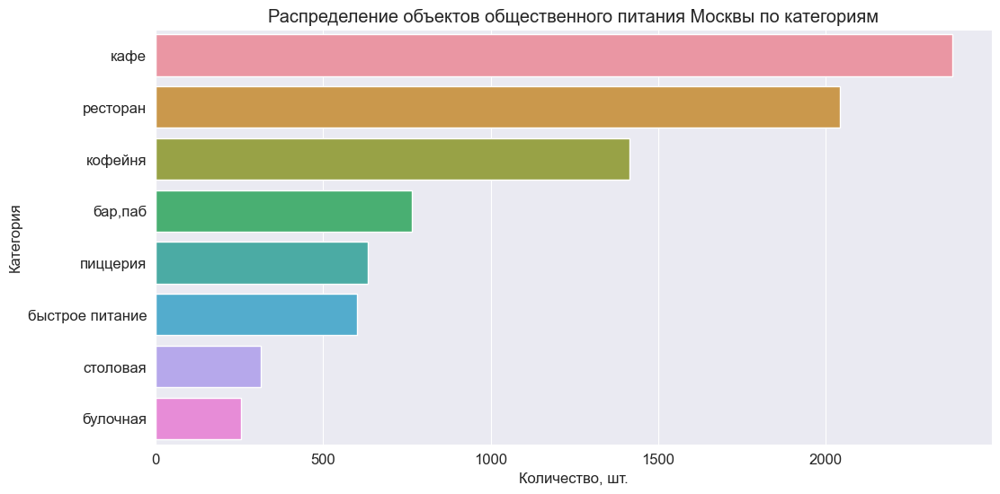

In [35]:
# визуализируем результат
sns.set_style('darkgrid')
ax = sns.barplot(x='quantity', y='category', data=df_1) 
ax.set_title('Распределение объектов общественного питания Москвы по категориям')
ax.set_xlabel('Количество, шт.')
ax.set_ylabel('Категория')
plt.show()
plt.show()

Все заведения общественного питания Москвы можно разделить на 8 категорий: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная.     
Наибольшее распространение получили кафе - 2376 штук (или 28,3% всех заведений). Слегка от них отстают рестораны, которые насчитывают 2041 заведение (или 24,3%). **Очевидно, что на данные категории приходится более половины всех заведений города.**   
Третьими по популярности являются кофейни (16,8%).   
Что касается малораспространенных категорий, то в Москве реже всего можно встретить столовую, или булочную (3,7% и 3,0% заведений соответственно).

---
*Заметим одну особенность: согласно официальной статистике Росстата, ежегодно с 2008 года число кафе, ресторанов и баров Москвы увеличивается: например, на 1 января 2021 года этот показатель составлял 10916 заведений, а на 1 января 2022 - 12106, на 1 января 2023 данные пока отсутствуют. Интересно, что по исследуемым нами данным в Москве в 2022 году нассчитывается всего не более 8,5 тыс объектов. Возникает вопрос: либо мы располагаем неполными данными, либо московский рынок общественного питания действительно так сильно просел и сократился на 30%, скажем, под действием влияния санкций западных стран. Известно, что в 2022 году многие зарубежные компании отказались от бизнеса в России. Если рынок действительно так сократился, то это можно рассмотреть как точки роста для отечественных предпринимателей, в том числе и для наших инвесторов. Отразим динамику показателя для наглядности на графике:*

In [36]:
colors = ['lightslategray',] * 7
colors[6] = 'crimson'

fig = go.Figure(data=[go.Bar(
    x=['2015', '2016', '2017', '2018', '2020', '2021', '2022'],
    y=[7921, 8295, 9096, 9999, 10916, 12106, 8401],
    marker_color=colors, 
)])
fig.update_layout(title_text='Динамика числа объектов питания Москвы по годам')
fig.update_xaxes(title='Год')
fig.update_yaxes(title='Число объектов')
fig.update_layout(width=900, height=500)

*К сожалению, выяснить за счет каких категорий произошло такое снижение не предоставляется возможным ввиду отсутствия такого среза информации.*

---

#### Исследование числа посадочных мест

Продолжим исследование. Построим график плотности распределения числа посадочных мест.

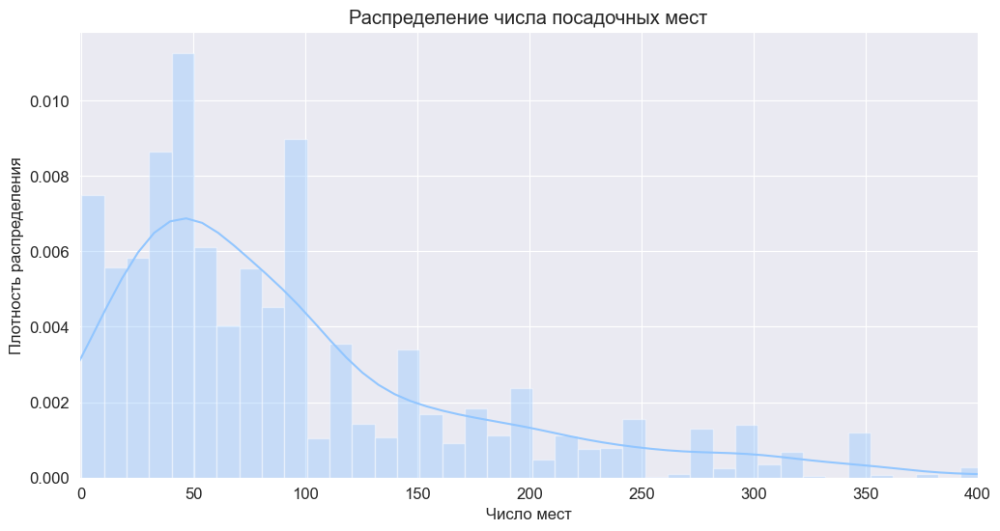

In [37]:
sns.distplot(data['seats'], bins=128)
plt.title('Распределение числа посадочных мест')
plt.xlabel('Число мест')
plt.ylabel('Плотность распределения')
plt.xlim(-1,400)
plt.show()

Наиболее характерными для совокупности являются заведения с числом посадочных до 100.  Самая высокая плотность распределения у заведений с числом посадочных мест 40-50. Хотя плотность распределения заведений с 90-100 местами тоже достаточно высока. В процессе исследования постараемся понять с чем это связано.   

Теперь исследуем количество посадочных мест в заведениях в разрезе их категорий.    

Из этапа предоработки нам известно, что, в среднем, на одно заведение приходится около 108 посадочных мест, в то время как у половины заведений этот показатель не превышает 75 мест (что свидетельствует о смещении среднего за счет аномально высоких значений). 
   Поэтому в разрезе по категориям считаем разумным рассмотреть как среднее число мест, так и их медиану. Построим столбчатую диаграмму, отображающую уровень среднего значения и медианы числа мест по каждой категории:

In [38]:
# создаем агрегированную таблицу
df = (
    data.pivot_table(index='category', values='seats', aggfunc=['mean','median', 'count'])
    .reset_index()
    .sort_values(by=(    'mean', 'seats'), ascending=False)
)

df.columns = ['category', 'mean', 'median', 'quantity']
df

,category,mean,median,quantity
0,"бар,паб",124.532,82.500,468
6,ресторан,121.870,86.000,1268
4,кофейня,111.200,80.000,751
7,столовая,99.750,75.500,164
2,быстрое питание,99.129,67.000,348
3,кафе,97.405,60.000,1216
5,пиццерия,94.496,55.000,427
1,булочная,89.385,50.000,148


Помним, что данные заполнены не все (по 43% заведений информация не заполнена), поэтому исследование проводилось только на заполненных 57%. С целью убедиться в том, что рассчитанным значениям можно доверять посмотрим на количество заведений с указанным числом посадочных мест среди категорий:

In [39]:
df[['category','quantity']].sort_values(by='quantity')

,category,quantity
1,булочная,148
7,столовая,164
2,быстрое питание,348
5,пиццерия,427
0,"бар,паб",468
4,кофейня,751
3,кафе,1216
6,ресторан,1268


В каждой категории более половины значений заполнены, поэтому рассчитанные значения среднего числа и медианы по группам можем считать "адекватными".    

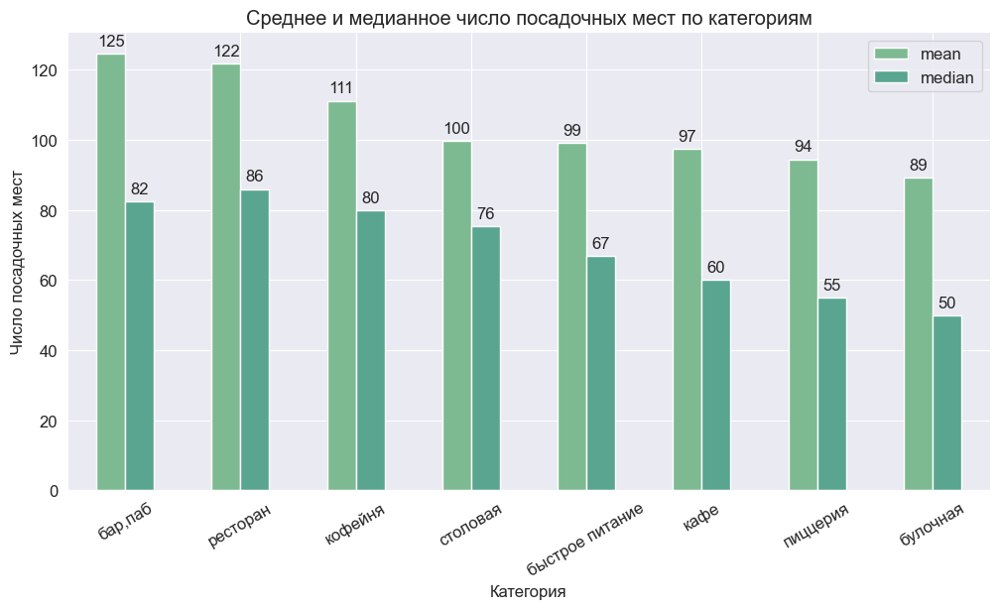

In [40]:
# строим столбчатую диаграмму
ax = df.plot(kind='bar', x='category', y=['mean', 'median'], grid=True, color=color)

# настроим отображение графика
# подпишем столбики с помощью функции
annotate (ax, '.0f')
plt.title('Среднее и медианное число посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Число посадочных мест')
plt.xticks(rotation=30)
plt.show()

Из диаграммы следует подтверждение общей ситуации: в разрезе категорий среднее значение тоже намного выше медианы.   

На основе тех данных, которые заполнены по данному признаку можем однозначно утверждать, что **меньше всего посадочных мест сосредоточено в булочных (в среднем, на них приходится 89 мест, но у половины заведений этот показатель не превышает 50), а больше всего - в барах, пабах и ресторанах (в барах и пабах, в среднем, это число составляет 125 мест, а в ресторанах - 122). У половины ресторанов число мест не превышает 86, а у половины пабов - 82 мест.**  Такая ситуация, возможно, может быть обусловлена тем, что в рестораны и бары/пабы посетители заходят не просто перекусить (как, например, часто бывает в кафе или пиццерии), а провести целый вечер и отдохнуть, либо, например, провести длительную деловую встречу в ресторане. Также не стоит забывать о высокой сложности блюд, приготовление которых тоже требует затрат времени. Таким образом, за счет "длительности" пребывания одного посетителя в заведении - требуется и расширение числа посадочных мест. Также в ресторанах часто проводятся банкетные мероприятия, которые требуют хорошей вместительности.

Чтобы оценить разброс значений числа посадочных мест по категориям, построим еще один график:

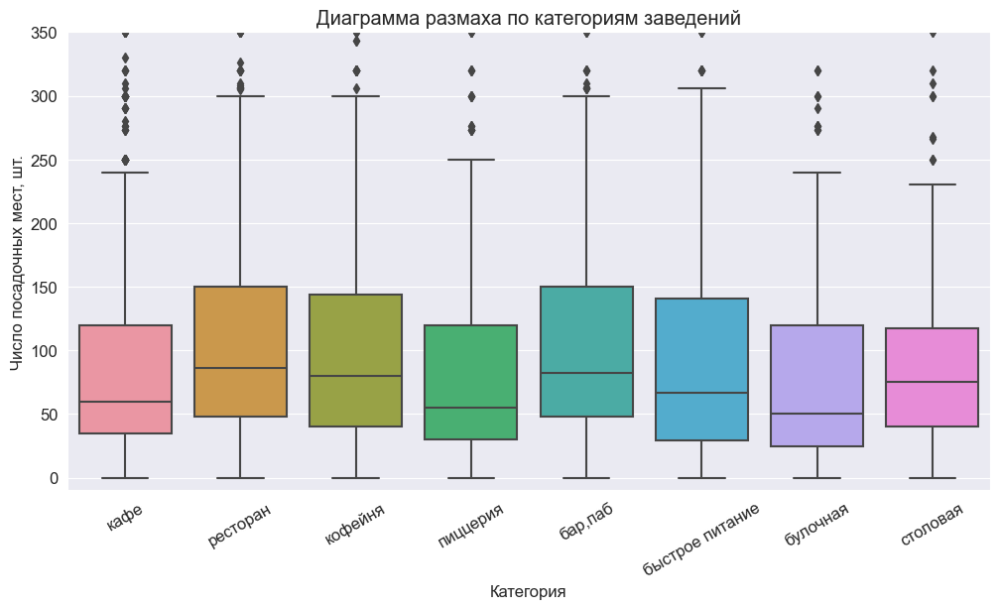

In [41]:
sns.boxplot(y ='seats', x='category', data=data) 
plt.title('Диаграмма размаха по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Число посадочных мест, шт.')
plt.ylim(-10,350)
plt.xticks(rotation=30)
plt.show()

Интересно, что во всех категориях заведений, кроме булочных, имеется заведение с вместимостью более 1000 посадочных мест, что выглядит странным (видно в случае закомментирования параметра plt.ylim(-10,400)).      
В целом, для нашей совокупности **показатели, превышающие 300 посадочных мест для любой категории, уже являются нехарактерными, а для кафе, пиццерий, булочных и столовых - свыше 250 мест.** 


Интересно оценить изменяется ли вместимость заведения в зависимости от сетевой принадлежности:

In [42]:
data.groupby('chain').agg({'seats':['mean','median']})

seats       
         mean median
chain               
0     104.140 70.000
1     114.711 80.000

**Число посадочных мест действительно в сетях больше, чем в несетевых заведениях**.

Проверим в каких категориях заведений преобладает такая тенденция:

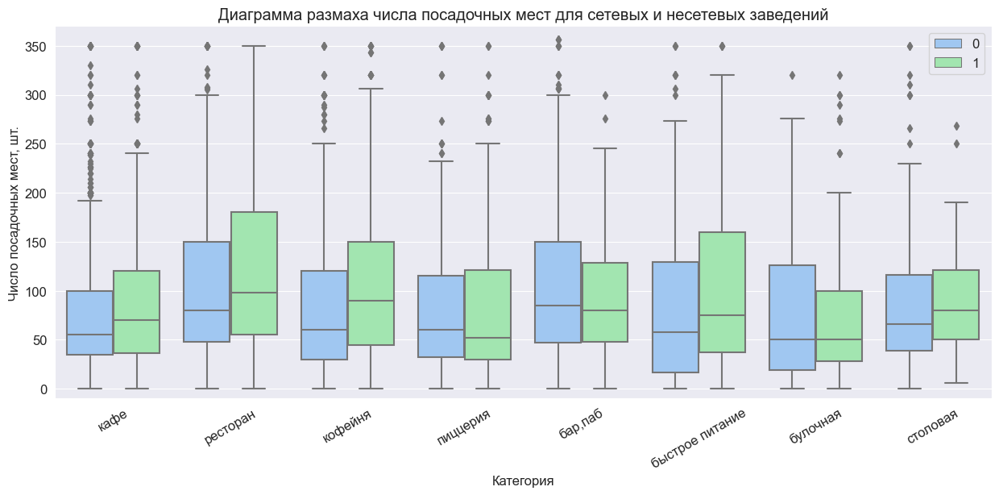

In [43]:
plt.figure(figsize = (15,6))
sns.boxplot(y ='seats', x='category', hue='chain', data=data) 
plt.title('Диаграмма размаха числа посадочных мест для сетевых и несетевых заведений')
plt.xlabel('Категория')
plt.ylabel('Число посадочных мест, шт.')
plt.ylim(-10,370)
plt.xticks(rotation=30)
plt.legend(loc='upper right')
plt.show()

Действительно, в среднем, значение посадочных мест в сетевых заведениях выше, чем в несетевых почти для всех типов объектов.  
Например, для сетевого ресторана характерно, в среднем, около 100 посадочных мест, а для несетевого - околоо 80. Что касается кафе, то для сети - это около 70 мест, а для несетевых кафе - около 55. Для сетевых кофеен - это почти 90 мест,  для несетевых - 60, разница кажется значительной.    
Но, что интересно, для несетевых баров число посадочных мест, в среднем, больше, чем для сетевых, а для булочных - оно одинаковое.

#### Исследование сетевых и несетевых заведений

Согласно "ГОСТ 31985-2013, который введен в действие Приказом Росстандарта от 27.06.2013 N 191-ст, *сетью предприятий питания является совокупность предприятий питания с общим ассортиментом изготавливаемой продукции и одинаковой формой организации потребления, объединенных под одной торговой маркой или брендом, управляемых по единым организационно-управленческим принципам, в т.ч. работающих по франшизе.*   

Проверим как распределились объекты питания по сетевой принадлежности:

In [44]:
data['chain'].value_counts()

0    5196
1    3205
Name: chain, dtype: int64

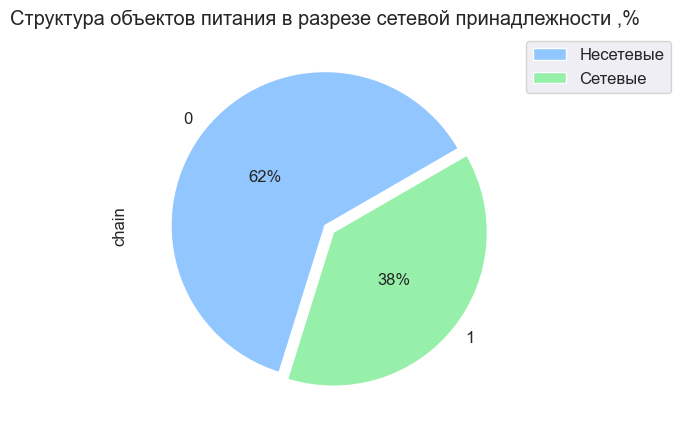

In [45]:
# визуализируем результат
explode = [0, 0.07]
data.groupby('chain')['chain'].count().plot(
    kind='pie', figsize=(5,5), autopct='%1.0f%%', pctdistance=0.5, startangle=30, explode=explode
)
plt.title('Структура объектов питания в разрезе сетевой принадлежности ,%')
plt.legend(labels=['Несетевые', 'Сетевые'], bbox_to_anchor=(1, 1))
plt.show()

**В большинстве случаев заведения общественного питания Москвы не являются сетевыми. На долю сетевых приходится только 38% заведений.**


Изучим какие категории заведений чаще являются сетевыми. В первую очередь отразим сколько сетевых и несетевых объектов в каждой из категорий, а ниже отдельно отобразим структуру сетевых заведений по категориям:

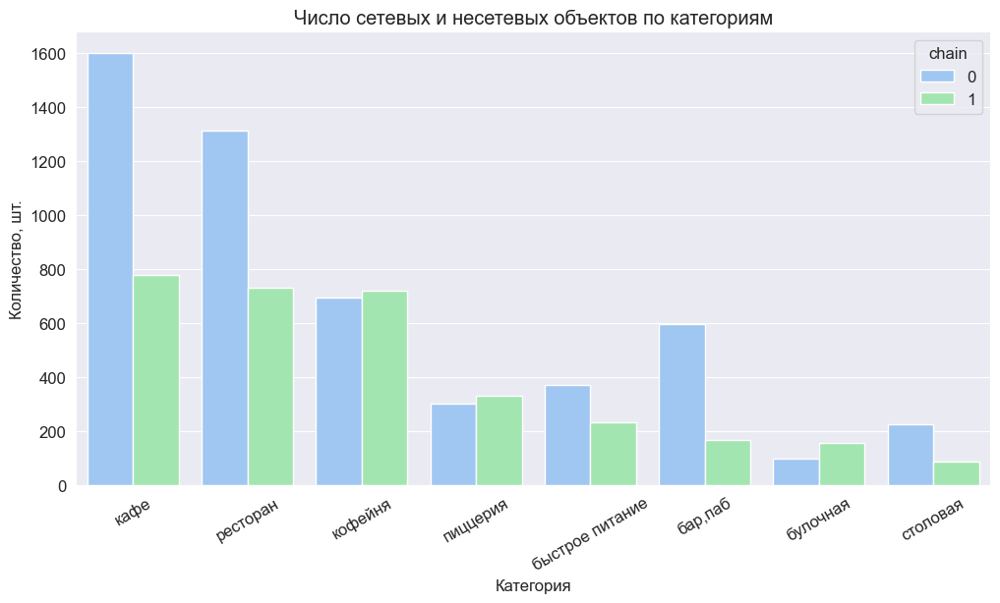

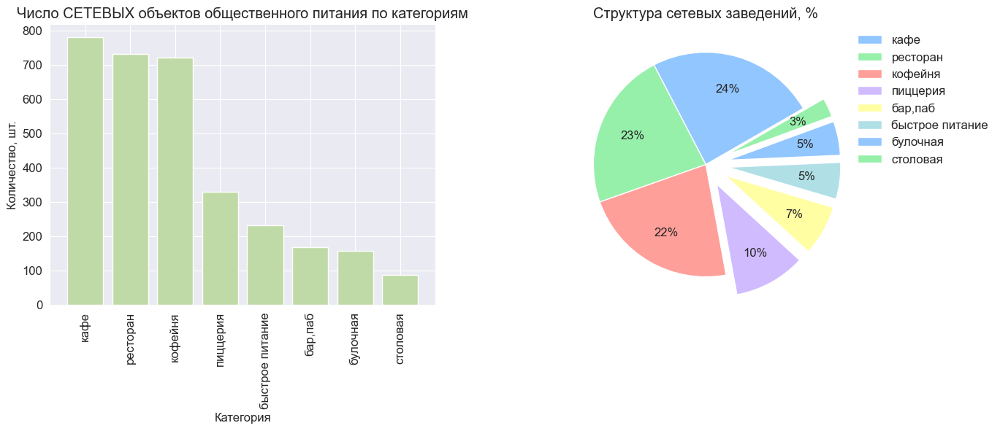

In [46]:
# строим столбчатый график, отражающий распределение сетевых и несетевых объектов по категориям
df=(data.groupby(['category', 'chain'])
        .agg({'address':'count'})
        .reset_index()
        .sort_values(by=['chain','address'], ascending=False)
   )
ax = sns.barplot(y='address',x='category', hue='chain', data=df)
#ax.bar_label (ax.containers[0])
#ax.bar_label (ax.containers[1])
ax.set_title('Число сетевых и несетевых объектов по категориям')
ax.set_ylabel('Количество, шт.')
ax.set_xlabel('Категория')
plt.xticks(rotation=30)
plt.show()
print('')



# строим фигуру из 2 диграмм:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
explode = [0, 0, 0, 0.2, 0.2, 0.2, 0.2, 0.2]

# 1 ДИАГРАММА: столбчатую диаграмму распределения объектов сетевых заведений по категориям
ax1.bar(
    x='category',
    height='address',
    color='#bfdaa6',
    data=df[df['chain']==1]
)
ax1.set_title('Число СЕТЕВЫХ объектов общественного питания по категориям')
ax1.set_ylabel('Количество, шт.')
ax1.set_xlabel('Категория')
#ax1.bar_label (ax1.containers[0], label_type='center')
ax1.tick_params('x', labelrotation=90)

# 2 ДИАГРАММА: круговую диаграмму структурного распределения объектов сетевых заведений по категориям
ax2.pie(
    data[data['chain']==1].groupby('category')['address'].count().sort_values(ascending=False),
    autopct='%1.0f%%',
    pctdistance=0.7,
    startangle=30, 
    explode=explode
   
)
ax2.set_title('Структура сетевых заведений, %')
plt.legend(labels=list(data['category'].unique()), frameon=False, bbox_to_anchor=(1, 1))
plt.show()

**Чаще всего сетевыми являются кафе, рестораны и кофейни** (на их долю приходится около 70% заведений группы).    

Если рассматривать заведения по категориям, в целом, то можно заметить, что:    
1. в кафе, ресторанах, барах и столовых несетевых заведений примерно в два раза больше, чем сетевых,          
2. в кофейнях, пиццериях и булочных - их практически поравну, но сетевых заведений все же чуть больше.

#### ТОП-15 популярных сетей Москвы

Определим ТОП-15 популярных сетей в Москве. Для этого сделаем срез по сетевым заведениям, сгруппируем данные по названию и посчитаем число заведений в каждой группе. Найдем 15 сетей с наибольшим числом объектов, результат сохраним в `top_15`:

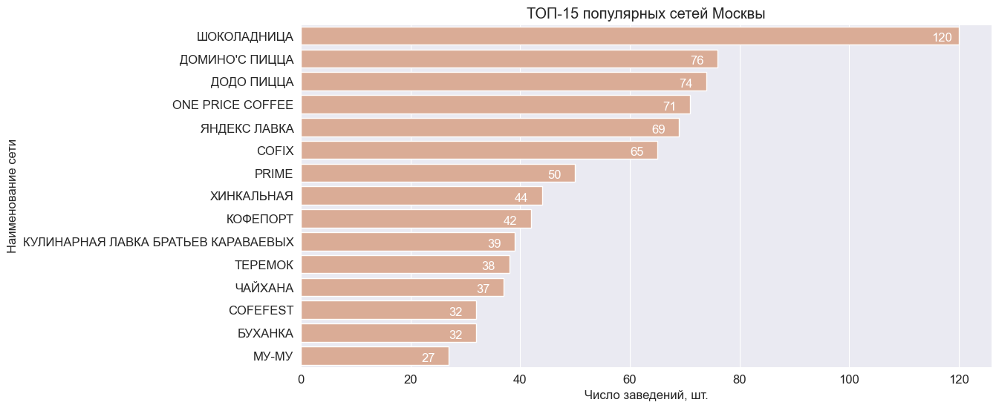

In [47]:
# отберем сетевые заведения, сгруппируем данные по названию заведения, определим число объектов в группе
top_15 = (
    data[data['chain'] ==1].pivot_table(index='name', values='address', aggfunc='count')
    .sort_values(by='address', ascending=False)
    .reset_index()
).head(15)
# переименуем столбцы
top_15.columns = ['name', 'quantity']

#отобразим результат на графике
ax = sns.barplot(x='quantity', y='name', data=top_15, color='#e5a88b') 
#ax.bar_label (ax.containers[0])
for i, v in enumerate(list(top_15['quantity'])):
    ax.text(v - 5, i + .25, str(v), color='white')
ax.set_title('ТОП-15 популярных сетей Москвы')
ax.set_xlabel('Число заведений, шт.')
ax.set_ylabel('Наименование сети')
plt.show()

**Самой популярной сетью стала "Шоколадница", которая насчитывает 120 заведений в Москве.**    
Среди ТОП-15 сетей встречаются как знакомые (такие как "Шоколадница", "Додо Пицца" и "Prime"), так и не совсем знакомые 
названия.   

Все эти сети, как минимум, схожи большим числом объектов в сотсаве сети. Но постараемся выяснить есть ли еще какой-то признак, который их все объединяет.

Проверим к каким категориям относятся данные сети:

In [48]:
#создаем сптсок из наименований ТОП-15
top_list=list(top_15['name'])

#отфильтруем исходную таблицу по этому списку
top=data[data['name'].isin(top_list)]
top=top[top['chain'] ==1]
top_agg = top.groupby('category').agg({'address':'count'}).reset_index().sort_values(by='address', ascending=False)

# построим круговую диаграмму по полученным данным
fig = px.pie(top_agg , values='address', names='category')
fig = go.Figure(data=[go.Pie(labels=top_agg['category'], values=top_agg['address'], pull=[0, 0, 0, 0, 0.3, 0.3, 0.3,0.3])])
fig.update_layout(
    title_text='Структура топовых сетей по категориям, %',
    width=600,
    height=600,
)
fig.show()

Интересно, что в состав Топовых сетей вошли представители всех категорий.    
Среди самых популярных сетей **больше всего кофеен - 41%, меньше всего булочных (3%) и заведений быстрого питания (1,5%)**, есть 4 бара и 2 столовых. 

Кроме того, рассчитаем среднее  число посадочных мест по каждой из сети, их средний рейтинг. Результат выведем в таблице:

In [49]:
top.groupby('name').agg({'rating':'mean', 'seats':'mean'}).sort_values(by='rating', ascending=False)

,rating,seats
name,,
БУХАНКА,4.397,76.667
КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,4.395,102.074
ХИНКАЛЬНАЯ,4.323,80.562
ДОДО ПИЦЦА,4.286,94.597
МУ-МУ,4.230,178.550
ШОКОЛАДНИЦА,4.178,135.145
ДОМИНО'С ПИЦЦА,4.170,52.820
КОФЕПОРТ,4.148,121.478
ТЕРЕМОК,4.124,111.296


Таким образом, заметили еще один объединяющий признак: **у всех популярных сетей нет низкой средней рейтинговой оценки, у всех она составляет около 4.0 (от 3,9 до 4,4).**     
Что касается среднего числа посадочных мест - то явной закономерности не наблюдается: встречаются разные уровни показателя.

#### Исследование заведений по административным районам Москвы 

Рассчитаем общее количество заведений Москвы по административным округам:

In [50]:
data.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)

,name
district,
Центральный административный округ,2242
Северный административный округ,899
Южный административный округ,892
Северо-Восточный административный округ,890
Западный административный округ,849
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,708
Северо-Западный административный округ,409


Согласно заданию, отобразим общее количество заведений и количество заведений каждой категории по районам на одном графике (при этом, общее количество по району выведем над каждым barом, а число заведений каждой категории будет доступно при наведении на нее мышью):

In [51]:
# агрегируем необходимые для визуализации данные
df = (
    data.pivot_table(index='district', columns='category', values='name', aggfunc='count')
    .reset_index()
)
df['total']=df[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis = 1)
df = df.sort_values(by='total', ascending=False)

# построим интерактивную столбчатую диаграмму
fig = px.bar(
    df,
    x='district', 
    y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
    title='Число объектов общественного питания по районам Москвы в разрезе категорий',
    labels={"value": "Число заведений, шт.", "district": "Округ"}
)
fig.update_xaxes(tickangle=50)
fig.update_layout(width=900, height=700)
fig.data[-1].text = list(df['total'])
fig.show() 

В исследовании принимают участие 9 округов Москвы. **Больше всего заведений сосредоточено в Центральном административном округе. Количество заведений здесь превышает количество заведений любого другого района более чем в 2-2,5 раза.**

#### Исследование среднего рейтинга заведений

В первую очередь изучим, как в целом распределена величина рейтинга:

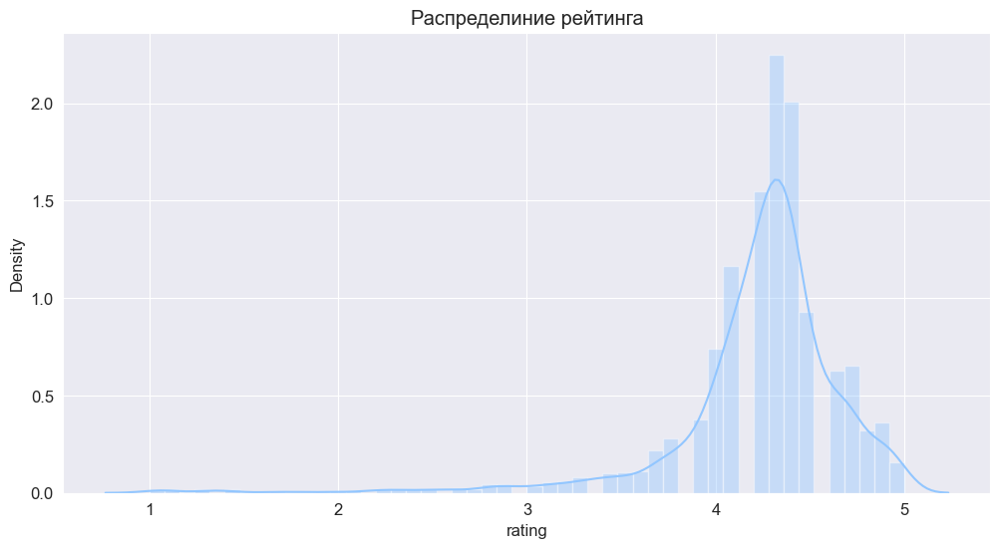

In [52]:
sns.distplot(data['rating'],bins=50) 
plt.title('Распределиние рейтинга')
plt.show()

Основная масса оценок находится в интервале от 4 до 4,5, также есть не очень много низких оценок: от 1 до 3,5, а есть и оценки, стремящиеся к наивысшему баллу.  

Теперь изобразим распределение среднего рейтинга по категориям заведений на столбчатой диаграмме, сгруппировав данные (результат агрегации сохраним в `data_rating`) :

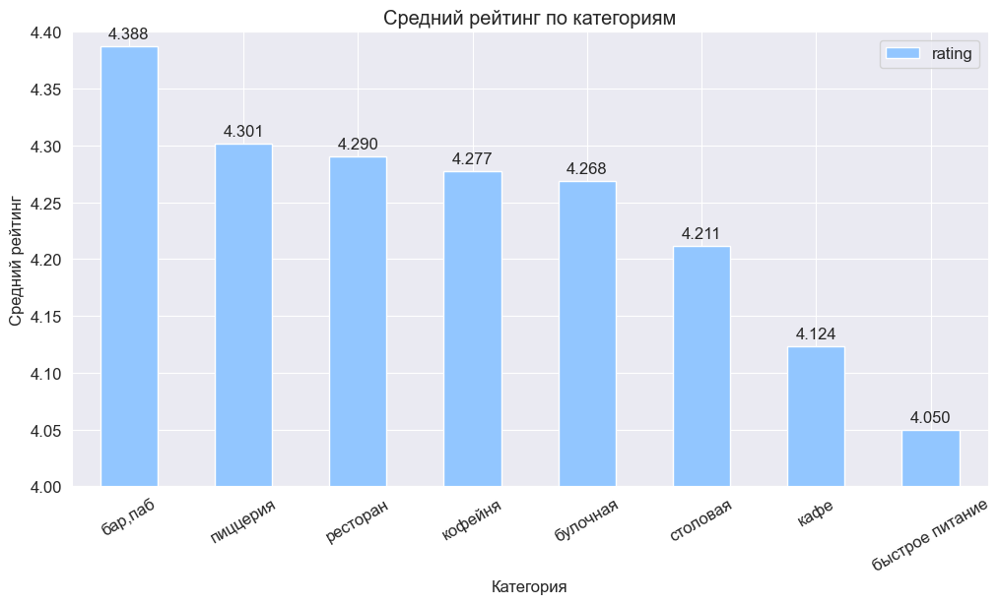

In [53]:
# агрегируем таблицу, выводим в ней средний рейтинг по категориям
data_rating = (
    data.groupby('category').agg({'rating':'mean'})
    .sort_values(by='rating', ascending=False) 
)

# строим столбчатую диаграмму
ax = data_rating.plot(kind='bar', rot=30)

#настраиваем отображение диаграммы
#ax.bar_label (ax.containers[0], fmt='%.3f')
annotate(ax, '.3f')
plt.ylim(4.0, 4.4)
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.show()   

На первый взгляд, кардинальных отличий в усредненных рейтингах разных типов общепита не видно. В целом, они все превышают оценку 4.0 и не превышают 4.39, примерно соизмеримы друг с другом. Но все же, полагаем, что для усредненного рейтинга отличие в 2-3 десятых дает основание выявить лидеров и аутсайдеров по рейтингу. Так, заведения быстрого питания явно отстают от других. А рейтинги баров незначительно выше, чем у других категорий.    

Проверим как изменяется средний рейтинг от района к району. Для этого выведем средний рейтинг по группам и сохраним его в переменную `data_rating` и по полученным данным построим хороплет:

In [54]:
data_rating = data.groupby('district', as_index=False).agg({'rating':'mean'})
data_rating

,district,rating
0,Восточный административный округ,4.174
1,Западный административный округ,4.182
2,Северный административный округ,4.240
3,Северо-Восточный административный округ,4.148
4,Северо-Западный административный округ,4.209
5,Центральный административный округ,4.378
6,Юго-Восточный административный округ,4.101
7,Юго-Западный административный округ,4.172
8,Южный административный округ,4.184


In [55]:
# загружаем JSON-файл с границами округов Москвы
state_geo = "admin_level_geomap (1).geojson"

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Средний рейтинг варьирует в тех же пределах.    
По карте видим, что **лучший средний рейтинг имеют заведения, расположенные в центре Москвы.** Чуть хуже рейтинг в северной части города. Самый низкий рейтинг - в Юго-Восточном административном округе.

Проверим какие заведения ЦАО являются наиболее рейтинговыми:

In [56]:
(data[data['district']=='Центральный административный округ'].groupby('category')
 .agg({'rating': 'mean'})
 .sort_values(by='rating', ascending=False)
)

,rating
category,
"бар,паб",4.486
ресторан,4.416
пиццерия,4.412
булочная,4.372
кофейня,4.336
столовая,4.315
кафе,4.302
быстрое питание,4.234


**Среди заведений центра Москвы самыми рейтинговыми являются бары и рестораны заведения быстрого питания также в аутсайдерах.**

#### Карта заведений

Отобразим все заведения датасета на карте с помощью кластеров, выведем информацию по каждому рейтингу:

In [57]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Заметно бросается в глаза высокое сосредоточение заведений в центральной части Москвы.

#### ТОП-15 улиц по числу заведений

Найдем улицы с максимальным числом заведений. Для этого сгруппируем данные по столбцу `street` и посчитаем количество заведений, отберем 15 с максимальным показателем. Результат сохраним в `sreet_top_15`:

In [58]:
# отберем сетевые заведения, сгруппируем данные по названию заведения, определим число объектов в группе
sreet_top_15 = (
    data.pivot_table(index='street', values='name', aggfunc='count')
    .sort_values(by='name', ascending=False)
    .reset_index()
).head(15)
# переименуем столбцы
sreet_top_15.columns = ['street', 'quantity']
sreet_top_15

,street,quantity
0,проспект Мира,183
1,Профсоюзная улица,122
2,Ленинский проспект,107
3,проспект Вернадского,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


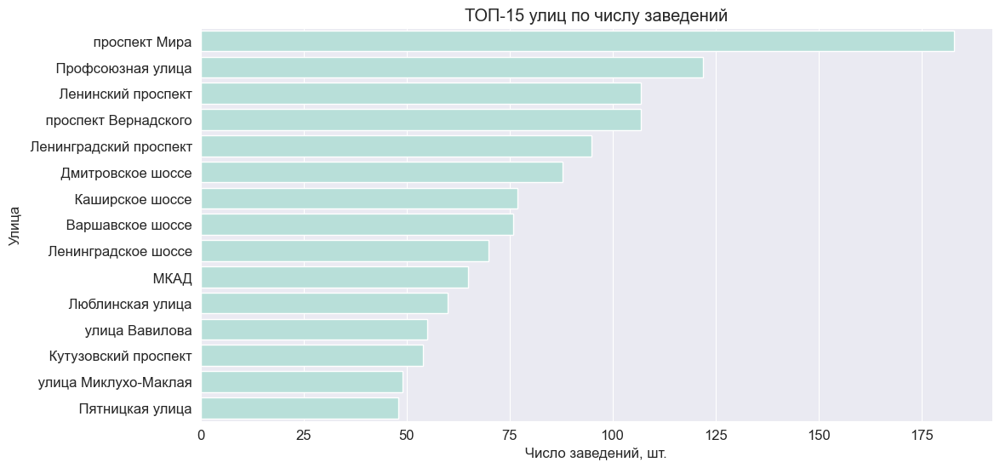

In [59]:
#отобразим результат на графике
ax = sns.barplot(x='quantity', y='street', data=sreet_top_15, color='#b1e6dd') 
#ax.bar_label (ax.containers[0])
ax.set_title('ТОП-15 улиц по числу заведений')
ax.set_xlabel('Число заведений, шт.')
ax.set_ylabel('Улица')
plt.show()

**Рекордсменом по числу заведений является проспект Мира (183 заведения).**    
Посмотрим к каким административным округам относятся эти улицы:

In [60]:
#создаем сптсок из наименований ТОП-15
top_list=list(sreet_top_15['street'])

#отфильтруем исходную таблицу по этому списку
top=data[data['street'].isin(top_list)]
top['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Западный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ',
       'Юго-Восточный административный округ'], dtype=object)

Как видим, ТОПовые улицы есть во всех административных округах Москвы.   
Изобразим как распределились заведения ТОПовых улиц в разрезе категорий:

In [61]:
df = (
    top.pivot_table(index='street', columns='category', values='name', aggfunc='count')
    .reset_index()
)
df['total']=df[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis = 1)
df = df.sort_values(by='total', ascending=False)

fig = px.bar(
    df,
    y='street', 
    x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
    title='Число объектов общественного питания по районам Москвы в разрезе категорий',
    barmode='group',
    labels={"value": "Число заведений, шт.", "street": "Название улицы"},
    
)
fig.update_layout(width=900, height=1500)
fig.show() 

В целом, на всех улицах преобладают одинаковые категории заведений с небольшими отличиями.  На большинстве из ТОПовых улиц преобладают кафе, рестораны и кофейни. Самое большое количество кафе расположено на проспекте Мира (более 50 заведений) и на МКАДе (около 45 единиц). Интересно, что на МКАДе вторыми по популярности являются заведения быстрого питания, что объясняется наличием дороги, а как следствие - спецификой питания водителей.    
Самое большое число ресторанов расположено также на проспекте Мира более 40 заведений.   
На Пятницой улице, Кутузовском проспекте, Лененградском шоссе, Варшавском шоссе, Дмитривском шоссе, проспекте Вернадского и Ленинском проспекте преобладают рестораны.

Теперь найдем улицы, на которых находится только один объект общепита, результат сохраним `one_street`:

In [62]:
one_street = data.groupby('street').agg({'name':'count'}).reset_index()
one_street = one_street[one_street['name']==1]
one_street_list=one_street['street']
one_street_data = data[data['street'].isin(one_street_list)]
one_street_data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,ДОМ ОБЕДА,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.886,37.493,4.100,средние,Средний счёт:300–500 ₽,400.000,NaN,0,180.000,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.877,37.465,4.500,no_info,no_info,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В ПАРКЕ ВКУСНЕЕ,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878,37.460,4.300,no_info,no_info,NaN,NaN,1,NaN,парк Левобережный,False


Изучим к каким районам относятся эти улицы:

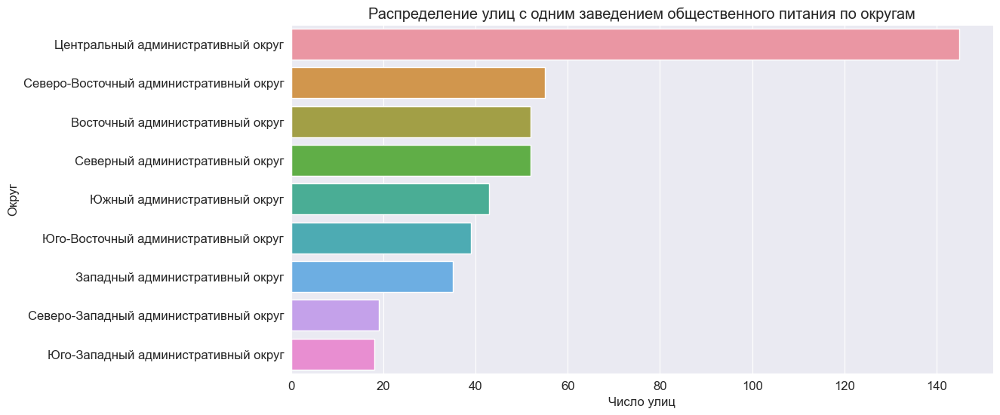

In [63]:
ax = sns.barplot(y='district', 
                 x='street', 
                 data=(
                     one_street_data.groupby('district')['street'].count()
                     .reset_index()
                     .sort_values(by='street', ascending=False))
                 )
ax.set_title('Распределение улиц с одним заведением общественного питания по округам')
ax.set_ylabel('Округ') 
ax.set_xlabel('Число улиц') 
plt.show()

**Большинство улиц с одним заведением также относятся к ЦАО.** Возможно, это связано с высокой концентрацией заведений в центре, и даже на маленьких улицах там "втиснуто" хотя бы одно заведение.

Проверим как обстоят дела с их рейтингом:

In [64]:
one_street_data['rating'].describe()

count   458.000
mean      4.237
std       0.462
min       1.000
25%       4.100
50%       4.300
75%       4.500
max       5.000
Name: rating, dtype: float64

Средний и медианный рейтинг практически похожи, но встречаются заведения с рейтингом 1.0. Проверим сколько среди таких адресов заведений с низким рейтингом (<=3)

In [65]:
len(one_street_data[one_street_data['rating']<=3.0])

15

**Всего у 3% этих заведений рейтинг ниже 3.0.** Таким образом, явной закономерности между показателями не просматривается.

Проверим какие категории среди них преобладают:

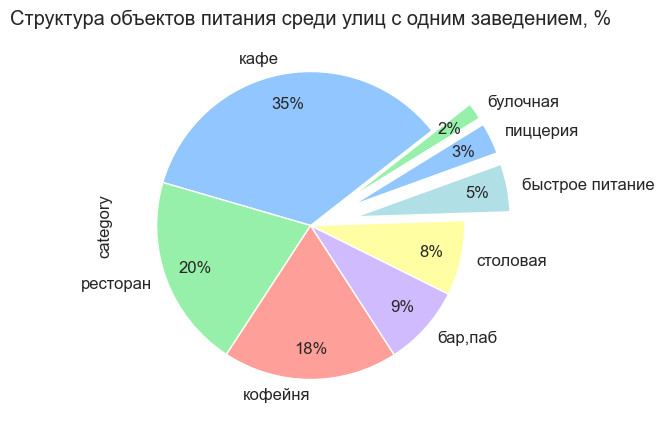

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [66]:
explode = [0, 0, 0, 0, 0, 0.3, 0.3, 0.3]
one_street_data['category'].value_counts().plot(
    kind='pie', figsize=(5,5), autopct='%1.0f%%', pctdistance=0.8, startangle=38, explode=explode
)
plt.title('Структура объектов питания среди улиц с одним заведением, %')
plt.show()
one_street_data['category'].value_counts()

Среди улиц с одним заведением, также как и в общем случае, преобладают кафе, рестораны и кофейни. 

#### Изучение ценовых диапазонов

Посчитаем медиану столбца `middle_avg_bill` для каждого района:

In [67]:
district_avg_bill = data.groupby('district', as_index=False).agg({'middle_avg_bill':'median'})
district_avg_bill.sort_values(by='middle_avg_bill',ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.000
5,Центральный административный округ,1000.000
4,Северо-Западный административный округ,700.000
2,Северный административный округ,650.000
7,Юго-Западный административный округ,600.000
0,Восточный административный округ,575.000
3,Северо-Восточный административный округ,500.000
8,Южный административный округ,500.000
6,Юго-Восточный административный округ,450.000


Построим фоновую картограмму для полученных значений:

In [68]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Ценовой индикатор районов',
).add_to(m)

# выводим карту
m

В первую очередь, отметим, что данные по этому признаку оказались заполнены лишь на 37%, что не очень много для однозначных выводов.      

Но из тех данных, которые заполнены, получается следующее: **самые высокие цены на питание - в заведениях ЦАО**, что логично. Размер среднего счета в половине заведений здесь может достигать до 1000 рублей. Но **интересно, что таким же "дорогим" как и центр является Западный административный округ**. Возможно, например, в силу того, что к нему относится территория аэропорта Внуково. А еще, согласно, внешним источникам, в ЦАО и ЗАО сосредоточены районы с элитной дорогостоящей недвижимостью Москвы. Как следствие, представители отрасли общественного питания, возможно, могут ориентироваться в вопросах ценообразования на более обеспеченного потребителя.

**Что касается районов с наименьшими ценами, то здесь можно выделить Северо-Восточный административный округ, Южный административный округ и Юго-Восточный административный округ. Средний счет здесь в половине заведений не превышает 450-542 рубля.**

#### Исследование дополнительных  параметров

Проверим сколько заведений работает ежедневно и круглосуточно:

In [69]:
data['is_24/7'].value_counts()

False    7671
True      730
Name: is_24/7, dtype: int64

Всего по Москве таких насчитывается 730 единиц. Нанесем на карту их расположение:

In [70]:
data_24_7 = data[data['is_24/7']==True]

In [71]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}, {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_24_7.apply(create_clusters, axis=1)

# выводим карту
m

Круглосуточные заведения находятся по всей территории Москвы, причем в центре находится не более 22% всех заведений с таким графиком работы, подавляющее большинство рассосредоточено по районам, территориально удаленным от центра Москвы.

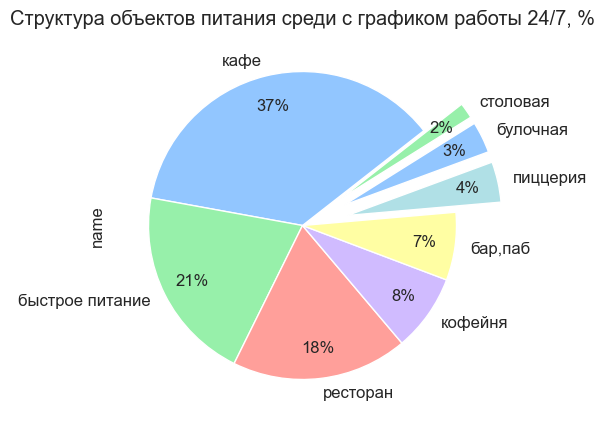

In [72]:
data_24_7.groupby('category')['name'].count().sort_values(ascending=False).plot(
    kind='pie', figsize=(5,5), autopct='%1.0f%%', pctdistance=0.8, startangle=38, explode=explode
)
plt.title('Структура объектов питания среди с графиком работы 24/7, %')
plt.show()

**Среди круглосуточных - больше всего кафе и заведений быстрого питания.**    
Оказывается, даже есть круглосуточные столовые.

Полезно посмотреть что объединяет заведения с низким рейтингом. Отберем из датасета объявления с рейтингом ниже 2.5 и попробуем найти характерные особенности:

In [73]:
data_bad_rating=data[data['rating']<=2.5]
len(data_bad_rating)

123

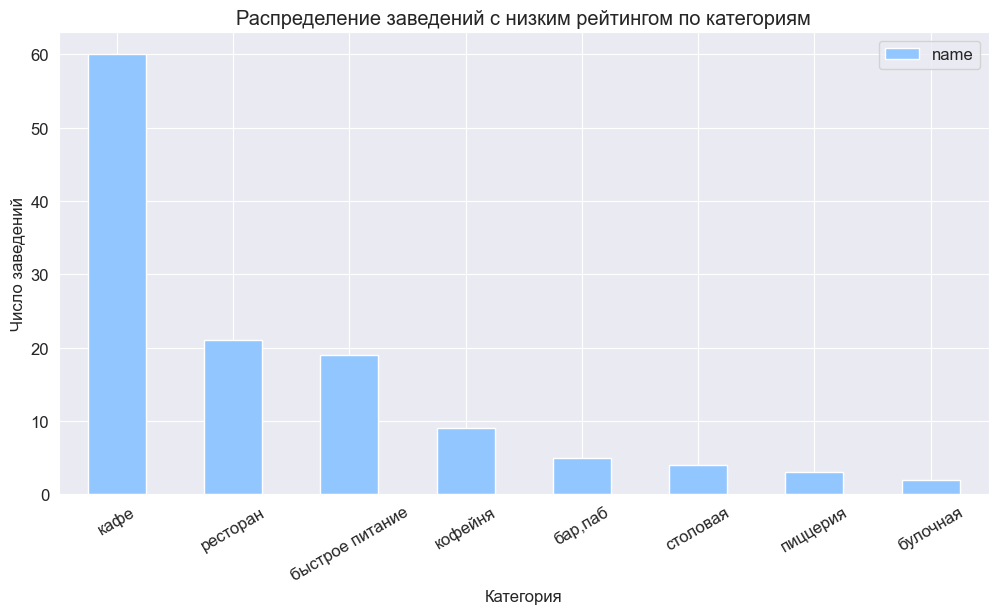

In [74]:
df=data_bad_rating.groupby('category').agg({'name':'count'}).sort_values(by='name',ascending=False)
df.plot(kind='bar', rot=30)
plt.title('Распределение заведений с низким рейтингом по категориям')
plt.xlabel('Категория')
plt.ylabel('Число заведений')
plt.show()

Больше всего заведений с низким рейтингом среди кафе, но данные показатели нельзя считать информативными. Здесь лучше стоит учесть относительные показатели, тогда картина может изментиться. Поэтому найдем долю заведений с плохим рейтингом от общей численности категории. Для вычисления используем  заготовленную ранее таблицу `df_1`

In [75]:
# сортируем необходимые данные
df_1 = df_1.sort_values(by='category')
df=df.sort_values(by='category').rename(columns={'name':'bad_quantity'}).reset_index()
df['total'] = df_1['quantity']
#находим процент
df['percent'] = df['bad_quantity']/df['total']*100
df.sort_values(by='percent', ascending=False)

,category,bad_quantity,total,percent
2,быстрое питание,19,602,3.156
3,кафе,60,2376,2.525
7,столовая,4,315,1.270
6,ресторан,21,2041,1.029
1,булочная,2,256,0.781
0,"бар,паб",5,765,0.654
4,кофейня,9,1413,0.637
5,пиццерия,3,633,0.474


Выводы действительно изменились. Таким образом, можем говорить, что **среди заведений с низким рейтингом - больше всего заведений быстрого питания.** Но также и кафе "находятся в зоне риска".     
**Наиболее безопасными в этом плане могут оказаться булочные, бары, кофейни и пиццерии.**

**Вывод**

Наиболее популярными являются кафе и рестораны(28,3% и 24,3% от всего московского общепита, соответственно). "Антипопулярными" являются булочные и столовые.   
Наибольшее число посадочных мест сосредоточено в барах и ресторанах (средние значения составляют около 120 мест). Самыми маленькими по вместительности являются булочные. 

В основном, на рынке общественного питания Москвы сосредоточены несетевые заведения со средней вместительностью 104 человека (при медиане 70). В целом, у несетевых заведений вместительность по числу посадочных мест ниже, чем у сетевых. В зависимости от категории заведения медианные показатели тоже изменяются: так, если для сетевых ресторанов усредненным показателем является около 100 мест, , для кафе - около 70 мест, а для кофеен - около 90, то для несетевых этот показатель будет ниже на 15-30 мест.

Среди сетевых объектов, которые составляют 38% заведений, наиболее распрастранены кафе, рестораны и кофейни. Самыми крупными сетями являются "Шоколадница", "Домино'с Пицца" и "Додо Пицца". Стоит отметить, что среди ТОП-15 сетей по числу заведений больше всего кофеен (41%), на втором месте - рестораны(23%).    

В исследовании приняли участие заведения из 9 административных округов. Центральный административный округ является самым наполненным по числу заведений округом (здесь сосредоточено 27% всех заведений). Кроме того, здесь же находятся заведения с самым высоким рейтингом. Стоит отметить, что наиболее высокий рейтинг - у баров, а заведения быстрого питания, в среднем, имеют рейтинг ниже, чем объекты остальных категорий.

ТОП-3 улицы Москвы с максимальным числом заведений - проспект Мира, Профсоюзная улица и Ленинский проспект (на проспекте Мира и Профсоюзной улице преобладают кафе, а на Ленинском проспекте - рестораны). Важно, что есть в Москве еще улицы, которые насчитывают лишь одно заведение - таких 458.

Интересно, что самые высокие цены на питание зафиксированы не только в Центральном, но и в Западном административном округе.   

С графиком работы "Ежедневно и круглосуточно" работает 9% заведений Москвы с преобладающей частью кафе и заведений быстрого питания.      
Среди заведений с низким рейтингом преобладают заведения быстрого питания.

### Шаг 4 . Детализация исследования: открытие кофейни

Для исследования данного вопроса отберем из датасета только кофейни, результат сохраним в `data_coffee` и выведем общее число кофеен на экран:

In [76]:
data_coffee = data[data['category']=='кофейня']
print('Всего кофеен:', len(data_coffee))

Всего кофеен: 1413


Рассмотрим как они распределились по районам:

In [77]:
data_coffee.groupby('district').agg({'name':'count'}).sort_values(by='name',ascending=False)

,name
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [78]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}, {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

**Около 44% кофеен (631 единица) сосредоточены в центральной части Москвы, а 30% от всех кофеен - относятся к Центральному административному округу.   
Если приблизить карту, то можно заметить низкую концентрацию кофеен на МКАДе. Чем ближе от него к центру, тем концентрация заведений больше.** 

Проверим на каких улицах ЦАО больше всего кофеен:

In [79]:
(data_coffee[data_coffee['district'] == 'Центральный административный округ'].groupby('street')['name'].count()
 .sort_values(ascending=False)).head(15)

street
 проспект Мира                   17
 Новослободская улица            13
 Верхняя Красносельская улица     7
 Усачёва улица                    7
 улица Земляной Вал               7
 Тверская улица                   6
 Таганская улица                  6
 Нижний Сусальный переулок        6
 Комсомольский проспект           6
 Пресненская набережная           6
 Садовническая улица              6
 Пятницкая улица                  6
 Большой Саввинский переулок      5
 улица Красная Пресня             5
 Нижняя Красносельская улица      5
Name: name, dtype: int64

**Проспект Мира и Новослободская улица являются улицами, насчитывающими максимальное число кофеен**

Посмотрим какие типы кофеен преобладают:

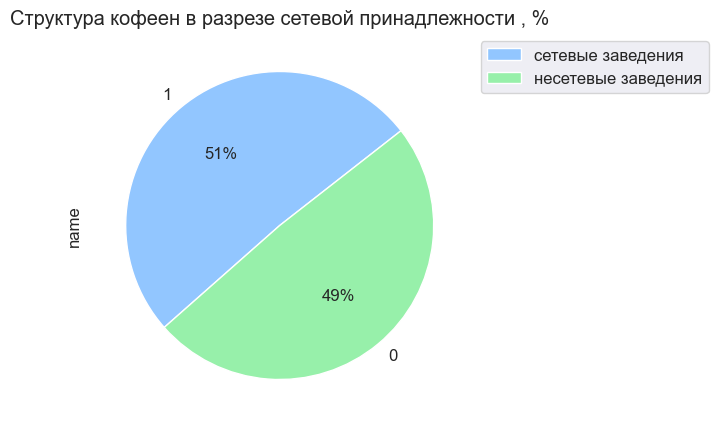

In [80]:
data_coffee.groupby('chain')['name'].count().sort_values(ascending=False).plot(
    kind='pie', figsize=(5,5), autopct='%1.0f%%', pctdistance=0.6, startangle=38
)
plt.title('Структура кофеен в разрезе сетевой принадлежности , %')
plt.legend(labels=['сетевые заведения', 'несетевые заведения'], bbox_to_anchor=(1, 1))
plt.show()

**Интересно, что кофейни разделились практически поровну на сетевые и несетевые.**

Проверим сколько круглосуточных кофеен:

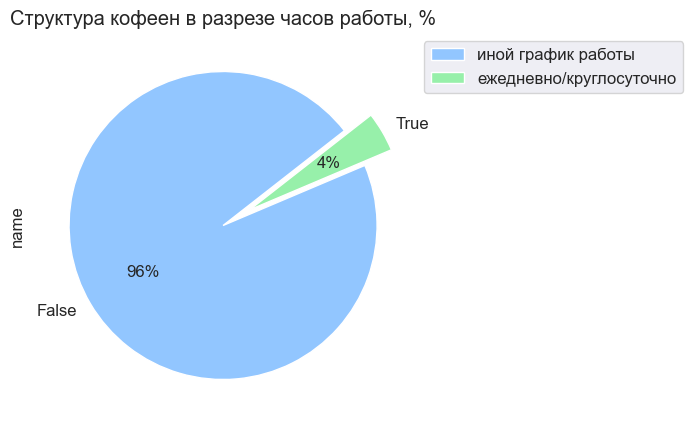

In [81]:
data_coffee.groupby('is_24/7')['name'].count().sort_values(ascending=False).plot(
    kind='pie', figsize=(5,5), autopct='%1.0f%%', pctdistance=0.6, startangle=38, explode=[0,0.2]
)
plt.title('Структура кофеен в разрезе часов работы, %')
plt.legend(labels=['иной график работы', 'ежедневно/круглосуточно'], bbox_to_anchor=(1, 1))
plt.show()

**Кофейни в подавляющем большинстве - заведения с графиком работы не 24/7.** Только 4% заведений открыты ежедневно и круглосуточно.  
Ситуация вполне объяснима: потребление кофе, вероятно, намного ниже в ночные часы.   

Проверим может ли круглосуточный график работы поднять рейтинги. Для этого выведем средний и медианный рейтинг по обеим группам и сравним их между собой:

In [82]:
data_coffee.groupby('is_24/7').agg({'rating':['mean', 'median']})

rating       
          mean median
is_24/7              
False    4.280  4.300
True     4.207  4.200

**В целом, круглосуточный график работы, никак не влияет на рейтинг.**

Можно было бы изучить как круглосуточный график работы влияет на среднюю цену, но ввиду большого числа пропусков в нужных данных (из 59 круглосуточных заведений - 46 с пропусками), результат может носить случайный характер и привести к ложным суждениям, поэтому делать этого не будем.

In [83]:
# проверим сколько значений пропущено в круглосуточных кофейнях
data_coffee[data_coffee['is_24/7']==True].isna().sum()

name                  0
category              0
address               0
district              0
hours                 0
lat                   0
lng                   0
rating                0
price                 0
avg_bill              0
middle_avg_bill      46
middle_coffee_cup    44
chain                 0
seats                22
street                0
is_24/7               0
dtype: int64

Следующим этапом изучим рейтинги кофеен, в целом, и как они распределяются по районам Москвы:

In [84]:
data_coffee['rating'].describe()

count   1413.000
mean       4.277
std        0.372
min        1.400
25%        4.100
50%        4.300
75%        4.400
max        5.000
Name: rating, dtype: float64

In [85]:
# выводим средний рейтинг кофеен по каждому округу
district_rating = data_coffee.groupby('district', as_index=False).agg({'rating':'mean'})
district_rating.sort_values(by='rating',ascending=False)

,district,rating
5,Центральный административный округ,4.336
4,Северо-Западный административный округ,4.326
2,Северный административный округ,4.292
7,Юго-Западный административный округ,4.283
0,Восточный административный округ,4.283
8,Южный административный округ,4.233
6,Юго-Восточный административный округ,4.226
3,Северо-Восточный административный округ,4.217
1,Западный административный округ,4.195


Нанесем результаты на карту

In [86]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг',
).add_to(m)

# выводим карту
m

В целом, рейтинги среди кофеен представлены широким диапазоном: от 1.4 до 5.0. Средний рейтинг по всем кофейням составляет 4.277 (медиана - 4.3).    
Если рассматривать данные в разрезе округов, то усредненные рейтинги находятся примерно на одинаковом уровне и колеблятся в пределах 4.2-4.34. Лидерами по рейтингам являются кофейни Центрального административного округа, а также Северо-Западного административного округа.

Помним, что число посадочных мест зависит от сетевой принадлежности, поэтому выясним как оно изменяется.
Для оценки используем медиану и среднее:

In [87]:
data_coffee.groupby('chain').agg({'seats': ['mean','median']})

seats       
         mean median
chain               
0      98.971 60.000
1     121.425 90.000

**У половины несетевых кафе показатель не превышает 60, а у сетевых - 90 мест.**

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Правильно!
</div>

In [88]:
data_coffee['seats'].describe()

count    751.000
mean     111.200
std      127.838
min        0.000
25%       40.000
50%       80.000
75%      144.000
max     1288.000
Name: seats, dtype: float64

Кроме того, рассмотрим какие категории цен, в целом, встречаются в кофейнях и в каком объеме:

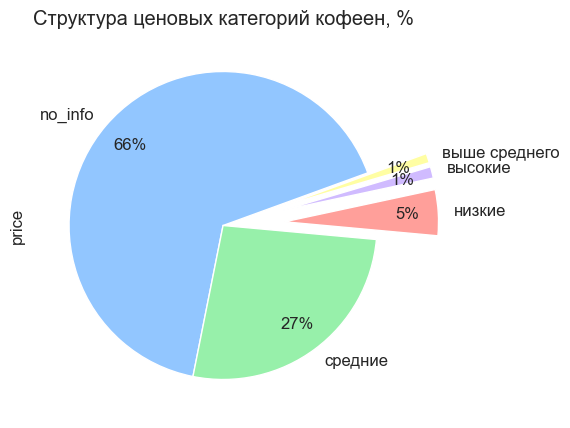

In [89]:
data_coffee['price'].value_counts().plot(
    kind='pie', figsize=(5,5), autopct='%1.0f%%', pctdistance=0.8, startangle=20, explode=[0, 0, 0.4,0.4,0.4]
)
plt.title('Структура ценовых категорий кофеен, %')
plt.show()

К сожалению, в данном случае пропуски в данных, могут сильно исказить реальную закономерность. Среди заполненных значений в кофейнях хоть и преобладают средние цены, но их количество очень мало, чтобы сделать корректные выводы.   

Проверим что у нас с данными по оценке среднего чека:

In [90]:
print('Процент пропусков: ' '{0:.1%}'.format(data_coffee['middle_avg_bill'].isna().mean()))
print('')
print('ОЦЕНКА СРЕДНЕГО ЧЕКА:')
data_coffee['middle_avg_bill'].describe()

Процент пропусков: 85.8%

ОЦЕНКА СРЕДНЕГО ЧЕКА:


count    200.000
mean     614.210
std      501.083
min        0.000
25%      300.000
50%      400.000
75%      750.000
max     2500.000
Name: middle_avg_bill, dtype: float64

Снова  большое количество пропусков, которое не позволяет корректно оценить средние и медианные значения показателей.

Для того, чтобы понять на какую стоимость чашки капучино рассчитывать при открытии, проверим сколько пропусков содержится в признаке `middle_coffee_cup`:

In [91]:
print('Процент пропусков: ' '{0:.1%}'.format(data_coffee['middle_coffee_cup'].isna().mean()))

Процент пропусков: 63.1%


Пропусков довольно много. А для достоверной полноты картины было бы неплохо проанализировать полные данные. В идеале разбить их на округа и на районы москвы и среди каждого найти средние и медианные показатели, а также изучить цены близлежащих конкурентов в шаговой доступности. На совокупность этих стоимостей и следует ориентироваться при открытии кофейни в определенном районе. Возможно, в первое время предлагая, маркетинговые чашки кофе, то есть чашки кофе по сниженной цене, позволяющие привлечь и удержать нового клиента. Который, распробовав, вернется за чашкой кофе большего объема и более высокой стоимости.

Попробуем нанести на карту среднюю стоимость чашки капучино в разрезе округов по тем данным, которые у нас имеются:

In [92]:
# подготавливаем данные
cup_price_rating = data_coffee.groupby('district', as_index=False).agg({'middle_coffee_cup':['median', 'mean']})
cup_price_rating.columns = ['district', 'median', 'mean']
cup_price_rating.sort_values(by='mean', ascending=False)

,district,median,mean
1,Западный административный округ,189.000,189.939
5,Центральный административный округ,190.000,187.519
7,Юго-Западный административный округ,198.000,184.176
0,Восточный административный округ,135.000,174.024
2,Северный административный округ,159.000,165.789
4,Северо-Западный административный округ,165.000,165.524
3,Северо-Восточный административный округ,162.500,165.333
8,Южный административный округ,150.000,158.488
6,Юго-Восточный административный округ,147.500,151.088


In [93]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_price_rating,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино',
).add_to(m)

# выводим карту
m

В Западном, Центральном и Юго-Западном административном округе средняя стоимость чашки капучино выше и составляет 185-190 рублей. Что касается низких цен, то самый недорогой кофе в Южном и в Юго-Восточном административном округе - 151-158 рублей за чашку.    Интересно, что в Восточном административном округе средняя цена на чашку составляет 174 рубля, в то время как у половины кофеен здесь кофе стоит не дороже 135 рублей за чашку.

**Рекомендации по открытию кофейни**    

С давних времен кофейни являются популярным местом отдыха. На основании имеющихся данных, можем говорить, что в Москве сейчас кофейни очень распространены и занимают третье место по числу точек, на их долю приходится около 17% всех заведений московского общепита. С одной стороны, нужно быть готовым к сложностям, поскольку рынок кофейных напитков крайне насыщен и полон значительной конкуренции, но с другой стороны и потенциал развития, при правильном подходе можно найти.  

Поэтому, в первую очередь, нужно выбрать "правильное" расположение. Это является залогом успеха заведения. И тут нам видится два варианта:  

1)открыть кофейню в Центральном административном округе, где и так огромный спектр предложения и величайшая конкуренция. Но в то же время - высокая проходимость, в том числе за счет туристического потока, который, возможно, позволит поддерживать необходимое количество посетителей в кофейне; высокая средняя стоимость за чашку кофе (190 рублей) плюс рейтинги заведений в этом районе выше.  (Но здесь стоит обратить внимание, что на проспекте Мира и  Новослободской улице уже насчитывается по 17 и 13 заведений этой категории, соответственно. На других "бойких" улицах округа их менее 8. Но есть также небольшие улицы и набержные, которые насчитывают по 1 заведению, возможно, к ним тоже стоит присмотреться)

2)открыть заведение, рассчитанное на более постоянную аудиторию, например, вблизи бизнес-центров, либо открыть кофейню, относящуюся к категории "у дома". Здесь можно присмотреться к районам Западного административного округа, поскольку средняя стоимость чашки кофе здесь примерно такая же высокая как в ЦАО (189 рублей). 

При открытии заведения в любом из этих округов стоит учитывать, что вместимость кофейни различается для сетей и несетевых заведений. Среди несетевых заведений у половины объектов вместимость не превышает 60 гостей, в то время как у сетей этот показатель - 90.   
Что касается графика работы, то рекомендуем присмотрется не к круглосуточному варианту.

И конечно, на какой бы точке карты не находилась кофейня, регулярно стоит изучать и превносить маркетинговые новшества.

### Общий вывод по исследованию

В процессе исследования были изучены характеристики по 8401 объекту общественного питания Москвы, расположенным в 9 административных округах. В результате были выявлены следующие особенности:   

**- Категории объектов общественного питания:**      
Кафе и рестораны являются самыми распространенными заведениями общественного питания. На их долю приходится 28% и 24% заведений, соответственно.  Третьими по популярности являются кофейни (17% заведений). Меньше всего рынок общественного питания Москвы представлен столовыми и булочными.     

**-Сетевые и несетевые заведения:**      
По большей части, рынок питания Москвы является несетевым. Сетевыми считаются 38% заведений.    
Характерными представителями сетей, почти в равной мере, являются кафе, рестораны и кофейни (24, 23 и 22%, соответственно). Самая крупная сеть насчитывает 120 заведений. Количество сетей, насчитывающих более 30 заведений - не велико (входят в ТОП-15).   
Среди крупных сетей наибольшее распространение получили кофейни (41%), рестораны(23%) и пиццерии(19%).

**-Число посадочных мест:**   
Заведения общественного питания Москвы представлены большим диапазоном числа посадочных мест: от заведений, где они вовсе отсутствуют до залов вместимостью 1200 гостей.  
Наиболее характерными для совокупности являются заведения с числом посадочных мест до 100. Если разбить совокупность на каждые 10 мест, то наибольшее распространение получили заведения с вместимостью 40-50 мест.    
Важно отметить, что число посадочных мест в сетевых заведениях больше, чем в несетевых и в каждой категории заведений - оно индивидуально.   

**География распространения:**     
Среди административных округов Москвы самым наполненным по числу заведений является Центральный административный округ.    
Он же содержит в себе самое большое число улиц с одним заведением питания (всего в Москве таких улиц 458).    
ЦАО можно считать районом с самым высоким средним чеком и районом, где находятся заведения с самыми высокими рейтингами.  

**РЕКОМЕНДАЦИИ**

Если верить статистике, то в настоящий момент рынок общественного питания Москвы, по сравнению с прошлым годом, значительно сократился, что, в свою очередь, может дать возможность для открытия перспективного бизнеса.   

В ходе исследования выснили, что наиболее перспективными для открытия могут оказаться кафе, и как альтернативный вариант - ресторан (поскольку рестораны являются вторыми по популярности с небольшой разницей). Все мы знаем, что спрос рождает предложение. Поэтому не смотря на то, что данные сегменты обладают высочайшей степенью конкуренции - в то же время их высокая концентрация свидетельствует об их востребованности у потребителя.    

Что касается вместимости, то здесь еще раз отметим, что для сетевых и несетевых заведений она различается, поэтому все зависит от выбора концепции. Так, если кафе является несетевым, то оптимальное число посадочных мест составляет до 55, если кафе сетевое - то оптимальное число мест увеличивается до 70. В случаях с ресторанами ситуация аналогичная: для несетевых - до 80 мест, для сетевых - около 100.   

В качестве места расположения рекомендуем обратить внимание на центр Москвы. Центральные улицы всегда ассоциируются с высокой проходимостью, с большим потоком людей, в том числе туристов. Такая "массовость" может позволить поддерживать нужное число посетителей какое-то время (при этом, конечно, стоит уделять особое внимание маркетинговым ходам). Да, судя по карте заведений, концентрация конкурентов в этом районе высочайшая, но с другой стороны поскольку все они существуют - вероятно, они обеспечены спросом.    
С особой осторожностью здесь рекомендуем отнестись к улицам, где сосредоточено наибольшее число объектов, так как существует риск не справиться с конкуренцией при неэффективном экономическом расчете. Возможно, стоит обратить внимание на улицы ЦАО, расположенные вблизи высокопроходимых объектов города с одним-двумя заведениями на них. В этом случае рекомендуем присмотреться к возможности открыть заведение альтернативной категории: то есть, например, если на улице уже открыто кафе, то можно попробовать открыть ресторан, если уже открыт ресторан - то проанализировать открытие кафе.

Считаем важным отметить, что исследование выполнено на основании имеющихся данных с большим содержанием пропусков в некоторых важных признаках (таких как средний чек, стоимость чашки капучино, число посадочных мест) и в случае, если бы эти данные были бы заполнены - результаты могли оказаться другими.  Кроме того, для более обоснованных рекомендаций было бы неплохо познакомиться с экономическими показателями заведений, владеть информацией о времени его существования, о клиентопотоке и детализировать анализ в рамках другого исследования.

----

### Презентация

https://disk.yandex.ru/i/kF3jR01ffy9tdg